<a href="https://colab.research.google.com/github/Hcardenass/Reconocimiento_Perro_Gato/blob/main/Reconocimiento_perro_gato.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [28]:
import tensorflow as tf
import tensorflow_datasets as tfds

#Descargar el set de datos de perros y gatos
datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True) #Set de datos que nos ofrece tensorflow

In [29]:
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    version=4.0.0,
    description='A large set of images of cats and dogs.There are 1738 corrupted images that are dropped.',
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    total_num_examples=23262,
    splits={
        'train': 23262,
    },
    supervised_keys=('image', 'label'),
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    title = {Asirra: A CAPTCHA that Exploits Interest-Aligned Manual Image Categorization},
    booktitle = {Proceedings of 14th ACM Conference on Computer and Communications Security (CCS)},
    ye

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

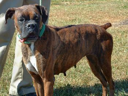
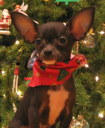
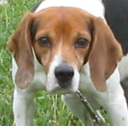
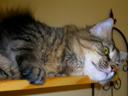
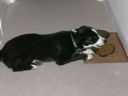

In [30]:
tfds.as_dataframe(datos['train'].take(5),metadatos)  #Esta es la manera mas simple de poder ver algunas imagenes 

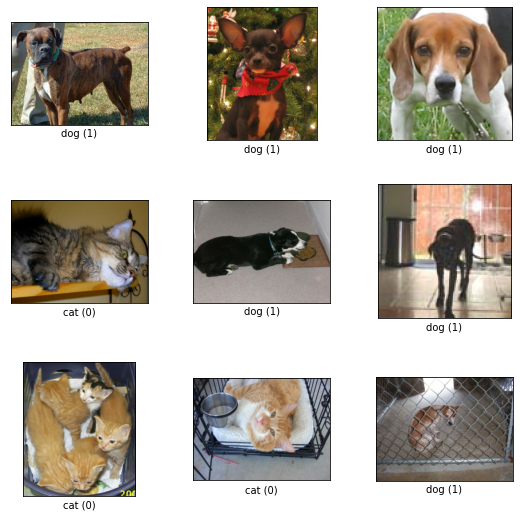

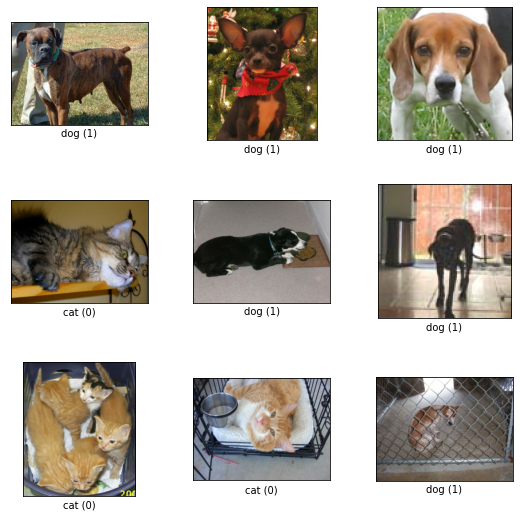

In [31]:
tfds.show_examples(datos['train'],metadatos)  # Esta opcion nos coloca la etiqueta abajo

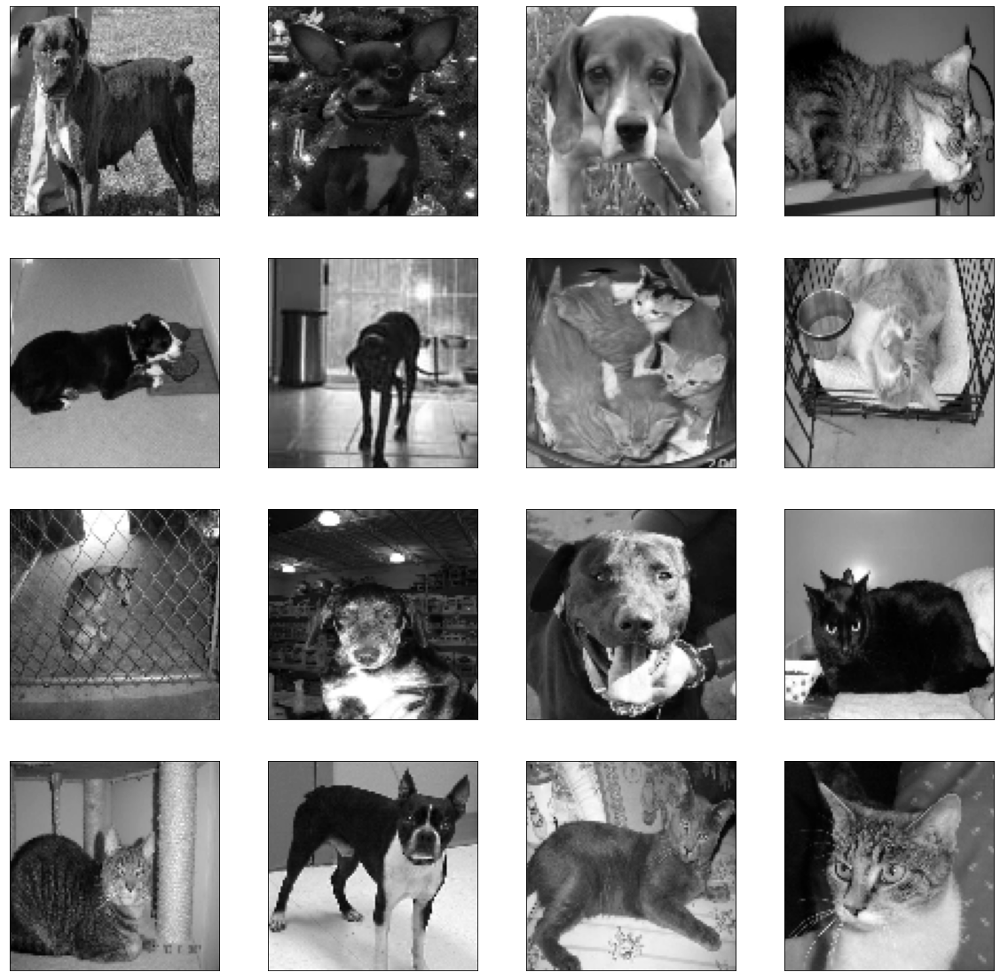

In [32]:
#Para obtener el control total sobre lo que vemos y aca tambien se haran unos cambios debido a que entrara a una red neuronal imagenes son de distintos tamaños horizontales, cuadrados ,etc

import matplotlib.pyplot as plt
import cv2   #Libreria para redimensionar las imagenes 

plt.figure(figsize=(20,20)) #Para mostrar las imagenes mas grandes 

#Esto es para que todas las imagenes tenga un igual tamaño
TAMANO_IMG=100

#Para mostrar imagenes la manera mas sencila que hay es iterando en los datos , en este caso se agrega una iteracion que recibe el indice y el par de imagen con la etiqueta 
for i, (imagen, etiqueta) in enumerate(datos['train'].take(16)):
    imagen = cv2.resize(imagen.numpy(),(TAMANO_IMG,TAMANO_IMG))
    imagen = cv2.cvtColor(imagen,cv2.COLOR_BGR2GRAY)       #Esta funcion para pasar a blanco y negro Nota: manejar imagenes a color es mas tardado que imagenes en blanco y negro
    plt.subplot(4,4,i+1)  #Para mostrar varias imagenes
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen,cmap='gray') #usamos el parametro cmap para indicar que solo utilizaremos un canal de color

    #Nota : aqui se pueden hacer varias cosas para ver como van a llegar las imagenes a la red para entrenarla

In [33]:
datos_entrenamiento = []  #Comenzaremos a entrenar con imagenes regualares  tal y como estan en el set , mas adelante con modelo de aumento de datos

In [34]:
for i, (imagen, etiqueta) in enumerate(datos['train']): #Se iterara en todos los datos de entrenamiento 
    imagen = cv2.resize(imagen.numpy(),(TAMANO_IMG,TAMANO_IMG))
    imagen = cv2.cvtColor(imagen,cv2.COLOR_BGR2GRAY)   # Se hacen las transformaciones en cada imagen y se agrega la imagen modificada en otro arreglo
    imagen = imagen.reshape(TAMANO_IMG,TAMANO_IMG,1) #Agregamos que cambiaremos de forma ya que sera tamano a 100,100,1 para que tensorflow no se confunda asi que lo establecemos
    datos_entrenamiento.append([imagen,etiqueta])  #Agregar imagen modificada al arreglo

In [8]:
datos_entrenamiento[0] #Ahora nuestro arreglo tiene todos los datos y imprimirmos el primer indice Podemos ver todos los valores de los pixeles

[array([[[242],
         [190],
         [105],
         ...,
         [189],
         [195],
         [143]],
 
        [[230],
         [130],
         [ 88],
         ...,
         [188],
         [179],
         [187]],
 
        [[170],
         [ 93],
         [ 84],
         ...,
         [131],
         [158],
         [168]],
 
        ...,
 
        [[112],
         [173],
         [164],
         ...,
         [141],
         [152],
         [119]],
 
        [[140],
         [151],
         [172],
         ...,
         [ 96],
         [150],
         [152]],
 
        [[ 92],
         [112],
         [168],
         ...,
         [ 44],
         [ 52],
         [ 47]]], dtype=uint8), <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [9]:
len(datos_entrenamiento) #longitud del arreglo osea la cantidad de imagenes

23262

In [36]:
#Preparar mejor los datos para el entrenamiento 
X = [] #imagenes de entrada (pixeles)
Y = [] #etiquetas (perro o gato)

for imagen, etiqueta in datos_entrenamiento:  #iteracion en todos los datos de train para que cada variable tenga los valores correspondientes
  X.append(imagen)
  Y.append(etiqueta)

In [39]:
X #Lista de pixeles

array([[[[0.94901961],
         [0.74509804],
         [0.41176471],
         ...,
         [0.74117647],
         [0.76470588],
         [0.56078431]],

        [[0.90196078],
         [0.50980392],
         [0.34509804],
         ...,
         [0.7372549 ],
         [0.70196078],
         [0.73333333]],

        [[0.66666667],
         [0.36470588],
         [0.32941176],
         ...,
         [0.51372549],
         [0.61960784],
         [0.65882353]],

        ...,

        [[0.43921569],
         [0.67843137],
         [0.64313725],
         ...,
         [0.55294118],
         [0.59607843],
         [0.46666667]],

        [[0.54901961],
         [0.59215686],
         [0.6745098 ],
         ...,
         [0.37647059],
         [0.58823529],
         [0.59607843]],

        [[0.36078431],
         [0.43921569],
         [0.65882353],
         ...,
         [0.17254902],
         [0.20392157],
         [0.18431373]]],


       [[[0.57254902],
         [0.45098039],
         [0.36

In [38]:
#Una transformacion mas que se debe hacer , Normalizacion 
import numpy as np

X = np.array(X).astype(float) / 255  #Convertir arreglo en numero flotante para tener puntos decimales

In [42]:
Y #Convertir todo en un arreglo que indique que 0 es un gato y 1 un perro 

array([1, 1, 1, ..., 0, 1, 0])

In [41]:
Y = np.array(Y) #Convertir arreglo de numpy

In [43]:
X.shape #Forma de la X

(23262, 100, 100, 1)

In [44]:
#Arquitectura e hiperparametros 
#3 modelos sin aumento de datos 
modeloDenso = tf.keras.models.Sequential([
      tf.keras.layers.Flatten(input_shape=(100,100,1)), #Este modelo tendra una capa de entrada recibiendo imagen de 100 x 100(10mil pixls) con un canal de color por ser en blanco y negro 
      tf.keras.layers.Dense(150,activation='relu'),    #2capas denseas de 150 neuronas c/u
      tf.keras.layers.Dense(150,activation='relu'),
      tf.keras.layers.Dense(1,activation='sigmoid')      #Capa de salida de 1 neurona  , etiquetas solo pueden ser un valor 0 para gato o 1 para perro                        
])                                                        #Sigmoid regresa valores entre  0 y 1


modeloCNN = tf.keras.models.Sequential([
         tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(100,100,1)),  
         tf.keras.layers.MaxPooling2D(2,2),                         #Redneuronal convolucional se agrega 3 pares de capas convulicionales 
         tf.keras.layers.Conv2D(64,(3,3),activation='relu'),         # y de agrupacion maxima pasando por 32 64 y 128 filtros
         tf.keras.layers.MaxPooling2D(2,2),
         tf.keras.layers.Conv2D(128,(3,3),activation='relu'),
         tf.keras.layers.MaxPooling2D(2,2),

         tf.keras.layers.Flatten(),
         tf.keras.layers.Dense(100,activation='relu'),
         tf.keras.layers.Dense(1,activation='sigmoid')                               
])

modeloCNN2 = tf.keras.models.Sequential([
         tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(100,100,1)),
         tf.keras.layers.MaxPooling2D(2,2),
         tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
         tf.keras.layers.MaxPooling2D(2,2),
         tf.keras.layers.Conv2D(128,(3,3),activation='relu'),
         tf.keras.layers.MaxPooling2D(2,2),

         tf.keras.layers.Dropout(0.5), #Significa que durante el entrenamiento en cada una de las epocas o ciclos de entramiento las neuronas tendran un 50% de probabilidad de desactivarse esto se usa ya que aveces despues del entrenamiento al ver el pesos de las redes algunos son muy grandes
         tf.keras.layers.Flatten(),      # y otros pequeños por lo que no estan siendo usados y no tienen mucha influencia en las decisioens de la red, al agregar esto permite que las neuronas dejen de flojear y empiecen a trabajar 
         tf.keras.layers.Dense(250,activation='relu'),
         tf.keras.layers.Dense(1,activation='sigmoid')                               
])

In [45]:
modeloDenso.compile(optimizer='adam',                
                    loss='binary_crossentropy',   #Funcion de perdida de aplica para resultados binarios es decir donde solo se tienen dos opciones de salida y procedemos a entrenar
                    metrics=['accuracy'])

modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [46]:
from tensorflow.keras.callbacks import TensorBoard # Usamos esta libreria para ver graficas de nuestros modelos y comparar como estan funcionando y hacerlos muy simple

In [47]:
tensorboardDenso = TensorBoard(log_dir='logs/denso') #Variable para entrenamiento y nombre de carpeta y sera distinta para cada modelo 
modeloDenso.fit(X, Y, batch_size=32,       #X = imagenes de entranemiento  Y = Etiquetas 
                validation_split=0.15,      # porcentaje para pruebas ya que no se tienen datos separados de train y test y solo es un set grande por eso se aplica porcentaje
                epochs=100,
                callbacks=[tensorboardDenso]) #Despues de cada una de las 100 epocas llama esta funcion y guardara en disco el resultado de dicha epoca 
                                                #de manera que una vez que termine se queda todo en un archivo que se puede usar para visualizar en tensorboard


Epoch 1/100
618/618 [==============================] - 4s 6ms/step - loss: 0.7283 - accuracy: 0.5458 - val_loss: 0.6704 - val_accuracy: 0.5903
Epoch 2/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6764 - accuracy: 0.5727 - val_loss: 0.6929 - val_accuracy: 0.5309
Epoch 3/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6707 - accuracy: 0.5872 - val_loss: 0.6685 - val_accuracy: 0.5974
Epoch 4/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6655 - accuracy: 0.5943 - val_loss: 0.6724 - val_accuracy: 0.5865
Epoch 5/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6630 - accuracy: 0.5982 - val_loss: 0.6703 - val_accuracy: 0.5957
Epoch 6/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6607 - accuracy: 0.6056 - val_loss: 0.6700 - val_accuracy: 0.5920
Epoch 7/100
618/618 [==============================] - 3s 5ms/step - loss: 0.6628 - accuracy: 0.5979 - val_loss: 0.6823 - val_accuracy: 0.6029

In [48]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [49]:
%tensorboard --logdir logs 


<IPython.core.display.Javascript object>

In [22]:
#Accuracy
# si visualizamos vemos que los datos no estan en el escenario que quisieramos,  en la presicion si vemos los datos de entrenamiento 
# suben mucho pero es basicamente porque esta aprendiendo el modelo , pero en los datos o set de pruebas es malo

#Perdida
#en la perdida del set de entrenamiento cada vez es menor lo cual parece que es bueno
#pero en el set de pruebas aumenta en pocas palabras se aprende los datos de entrenamiento y con eso Funciona pero no sirve en el mundo 
#real, esto pasa por algo que se llama sobre ajuste que se aprende de memoria los datos de entrenamiento y no puede generalizar y con datos de prueba o mundo real ira mal 



In [50]:
tensorboardCNN = TensorBoard(log_dir='logs/cnn')
modeloCNN.fit(X, Y, batch_size=32,       #X = imagenes de entranemiento  Y = Etiquetas 
                validation_split=0.15,      # porcentaje para pruebas ya que no se tienen datos separados de train y test y solo es un set grande por eso se aplica porcentaje
                epochs=100,
                callbacks=[tensorboardCNN]) #Despues de cada una de las 100 epocas llama esta funcion y guardara en disco el resultado de dicha epoca 
                                                #de manera que una vez que termine se queda todo en un archivo que se puede usar para visualizar en tensorboard


#De entrada se puede apreciar que al red convolucional es mucho mejor pero llega al 100% en los datos de entrenamiento y sufren un sobre ajuste , 
#visto principalmente en la perdida , donde la perdida del entrenamiento baja a 0 pero la validacion comenzo bajando y sube y sube y aqui el sobre ajuste se ve mas dramatico modelo tramposo que se aprende los datos del entrenamiento pero en el mundo real va mal

Epoch 1/100
618/618 [==============================] - 17s 26ms/step - loss: 0.5991 - accuracy: 0.6650 - val_loss: 0.5231 - val_accuracy: 0.7415
Epoch 2/100
618/618 [==============================] - 15s 24ms/step - loss: 0.4688 - accuracy: 0.7736 - val_loss: 0.4790 - val_accuracy: 0.7676
Epoch 3/100
618/618 [==============================] - 15s 24ms/step - loss: 0.4027 - accuracy: 0.8148 - val_loss: 0.4224 - val_accuracy: 0.7997
Epoch 4/100
618/618 [==============================] - 15s 24ms/step - loss: 0.3403 - accuracy: 0.8494 - val_loss: 0.4646 - val_accuracy: 0.7920
Epoch 5/100
618/618 [==============================] - 15s 24ms/step - loss: 0.2720 - accuracy: 0.8847 - val_loss: 0.4434 - val_accuracy: 0.8175
Epoch 6/100
618/618 [==============================] - 15s 24ms/step - loss: 0.2064 - accuracy: 0.9140 - val_loss: 0.4016 - val_accuracy: 0.8289
Epoch 7/100
618/618 [==============================] - 15s 25ms/step - loss: 0.1432 - accuracy: 0.9447 - val_loss: 0.4582 - val_ac

In [51]:
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modeloCNN2.fit(X, Y, batch_size=32,       #X = imagenes de entranemiento  Y = Etiquetas 
                validation_split=0.15,      # porcentaje para pruebas ya que no se tienen datos separados de train y test y solo es un set grande por eso se aplica porcentaje
                epochs=100,
                callbacks=[tensorboardCNN2]) #Despues de cada una de las 100 epocas llama esta funcion y guardara en disco el resultado de dicha epoca 
                                                #de manera que una vez que termine se queda todo en un archivo que se puede usar para visualizar en tensorboard

# hay algo de diferencia y se ve un poco mejor , pero la perdida tardo mas en crecer que la red convolucional regular    y no llega tan arriba  pero de igual manera sube y el entrenamiento hasta 0 
#esta mejor pero sigue siendo un modelo con muchas areas de oportunidad                                          

Epoch 1/100
618/618 [==============================] - 17s 27ms/step - loss: 0.6079 - accuracy: 0.6536 - val_loss: 0.5222 - val_accuracy: 0.7456
Epoch 2/100
618/618 [==============================] - 15s 25ms/step - loss: 0.4860 - accuracy: 0.7638 - val_loss: 0.4530 - val_accuracy: 0.7871
Epoch 3/100
618/618 [==============================] - 15s 25ms/step - loss: 0.4223 - accuracy: 0.8069 - val_loss: 0.3820 - val_accuracy: 0.8258
Epoch 4/100
618/618 [==============================] - 16s 25ms/step - loss: 0.3820 - accuracy: 0.8260 - val_loss: 0.3741 - val_accuracy: 0.8292
Epoch 5/100
618/618 [==============================] - 16s 25ms/step - loss: 0.3424 - accuracy: 0.8485 - val_loss: 0.3623 - val_accuracy: 0.8332
Epoch 6/100
618/618 [==============================] - 15s 25ms/step - loss: 0.3134 - accuracy: 0.8618 - val_loss: 0.3714 - val_accuracy: 0.8378
Epoch 7/100
618/618 [==============================] - 16s 26ms/step - loss: 0.2801 - accuracy: 0.8805 - val_loss: 0.3206 - val_ac

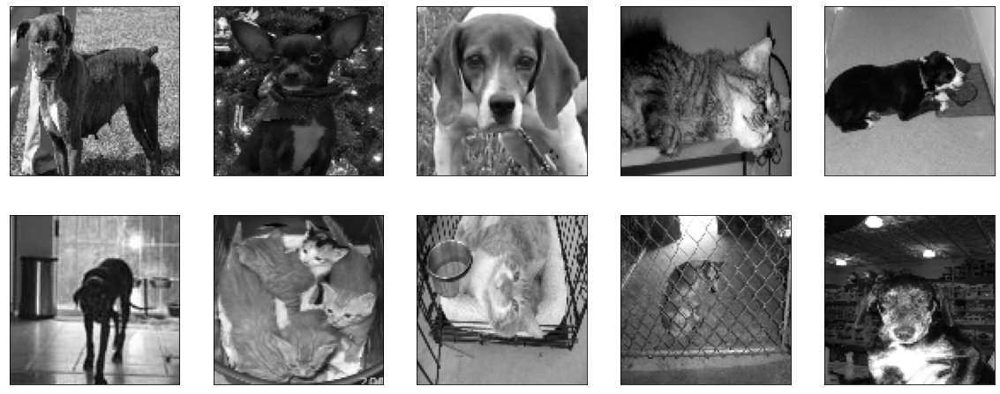

In [52]:
plt.figure(figsize=(20,8))

for i in range(10):
  plt.subplot(2, 5, i+1)                        #Aca mostramos las imagenes originales tal y como se tienen almacenadas en la variable X
  plt.xticks([])                                  # luego hacemos iteracion para mostrar 10 imagenes con dos filas de 5 columnas
  plt.yticks([])
  plt.imshow(X[i].reshape(100, 100),cmap="gray")   # se usa reshape para cambiar la forma de la iamgen a 100 x 100 porque la red se confunde si esque se tienen mas dimensiones



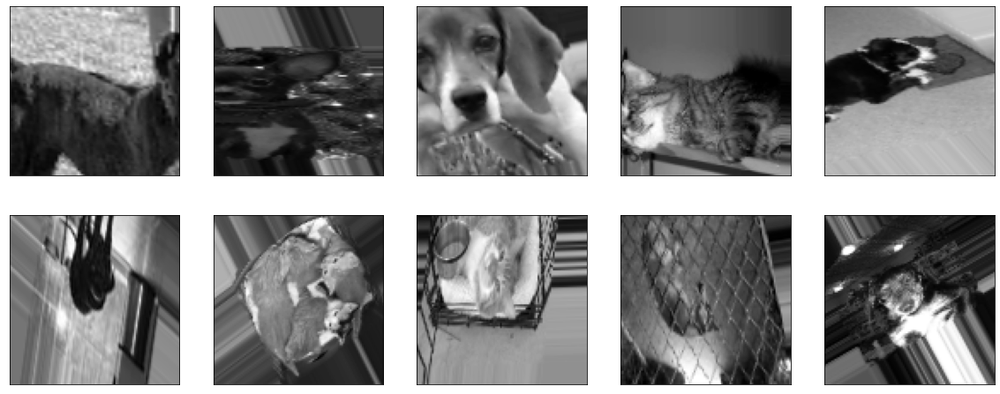

In [53]:
#Importar el generador con aumento de datos
from tensorflow.keras.preprocessing.image import ImageDataGenerator #nos da varias opciones para el aumento de datos en el entrenamiento

datagen = ImageDataGenerator(
    rotation_range=30, #Angulo maximo de rotacion aleatorio de las imagenes, al ejecutar se mostraran la trnasformacionn de rotacion aleatoria
    width_shift_range=.2, #Sirve para mover la imagen a los lados con un dato desde 0 hasta 1
    height_shift_range=.2, #Sirve para mover la imagen arriba y abajo
    shear_range=15, #Sirve para que la imagen se inclin, si uso mucho se vera feo 
    zoom_range=[.5,1.5], #Permite dar un arreglo y nos dice que tan pequeño o que tan grande es el acercamiento, en este caso hasta la mtiad de la imagen hasta un 150%
    vertical_flip =True, #Se usa para hacer rotaciones aleatorias verticalmente
    horizontal_flip =True 
)

datagen.fit(X)  #En este punto el generador toma todas las imagenes para entender los tamaños y tipo de imagenes y poder calcular de que manera hara las transformaciones cuando se lo pidamos

#Graficar las imagenes transformadas 
plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(X,Y,batch_size=10,shuffle=False):   #Shuffler= false quiere decir que nos dara las imagenes en el orden original
  for i in range(10):
    plt.subplot(2, 5, i+1)             #Solo iteramos una vez           
    plt.xticks([])                                  
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100, 100),cmap="gray")   #Solo cuando vamos a pintar la imagen colocamos la variable imagen y usamos el indice i que va desde 0 a 9
  break

In [54]:
#Ahora usando el generador preparado en vez de X y Y

modeloDenso_AD = tf.keras.models.Sequential([
      tf.keras.layers.Flatten(input_shape=(100,100,1)), #Este modelo tendra una capa de entrada recibiendo imagen de 100 x 100(10mil pixls) con un canal de color por ser en blanco y negro 
      tf.keras.layers.Dense(150,activation='relu'),    #2capas denseas de 150 neuronas c/u
      tf.keras.layers.Dense(150,activation='relu'),
      tf.keras.layers.Dense(1,activation='sigmoid')      #Capa de salida de 1 neurona  , etiquetas solo pueden ser un valor 0 para gato o 1 para perro                        
])                                                        #Sigmoid regresa valores entre  0 y 1


modeloCNN_AD = tf.keras.models.Sequential([
         tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(100,100,1)),
         tf.keras.layers.MaxPooling2D(2,2),                         #Redneuronal convolucional se agrega 3 pares de capas convulicionales 
         tf.keras.layers.Conv2D(64,(3,3),activation='relu'),         # y de agrupacion maxima pasando por 32 64 y 128 filtros
         tf.keras.layers.MaxPooling2D(2,2),
         tf.keras.layers.Conv2D(128,(3,3),activation='relu'),
         tf.keras.layers.MaxPooling2D(2,2),

         tf.keras.layers.Flatten(),
         tf.keras.layers.Dense(100,activation='relu'),
         tf.keras.layers.Dense(1,activation='sigmoid')                               
])

modeloCNN2_AD = tf.keras.models.Sequential([
         tf.keras.layers.Conv2D(32, (3,3), activation='relu',input_shape=(100,100,1)),
         tf.keras.layers.MaxPooling2D(2,2),
         tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
         tf.keras.layers.MaxPooling2D(2,2),
         tf.keras.layers.Conv2D(128,(3,3),activation='relu'),
         tf.keras.layers.MaxPooling2D(2,2),

         tf.keras.layers.Dropout(0.5),
         tf.keras.layers.Flatten(),
         tf.keras.layers.Dense(250,activation='relu'),
         tf.keras.layers.Dense(1,activation='sigmoid')                               
])

In [55]:
modeloDenso_AD.compile(optimizer='adam',                
                    loss='binary_crossentropy',   #Funcion de perdida de aplica para resultados binarios es decir donde solo se tienen dos opciones de salida
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [56]:
#Aqui para usar el Aumento de Datos si tenemos que hacer la separacion en datos Train y Test asi que considerando que utilizamos mas arriba el 0.15 para datos pruebas entonces aca se considerara 0.85
len(X) * 0.85 #19700 Datos de entrenamiento 
len(X) - 19700 #3562 Datos para pruebas 

X_entrenamiento = X[:19700]  #Valores de X Hasta el indice 19700     85% de entrenamiento  
X_validacion = X[19700:]    #Valores de X Desde el indice 19700 hasta el final del arreglo   15% para pruebas

Y_entrenamiento = Y[:19700]  #Lo mismo con las etiquetas 
Y_validacion = Y[19700:]



In [57]:
#Ahora se prepara el generador de datos transformados para el entrenamiento y se usa funcion flow y se dan las variables de entrenamiento y tamaño de lote
data_gen_entrenamiento = datagen.flow(X_entrenamiento , Y_entrenamiento , batch_size = 32)

In [58]:
#Este comando se ejecuta para llamar al recolector de basura de memoria de python y liberar algo de memoria Ram
import gc
gc.collect()

15756

In [59]:
#Ahora si para entrenar se define la variable con el nuevo nombre _AD ( unico)

tensorboardDenso_AD = TensorBoard(log_dir='logs/denso_AD')
modeloDenso_AD.fit(
                data_gen_entrenamiento,       #Se usa la funcion fit pero ahora en vez de X y Y se manda el generador de datos aumentados
                epochs=100, batch_size=32,
                validation_data=(X_validacion, Y_validacion), #datos de validacion x que son imagenes y Y que son eituqetas 
                steps_per_epoch=int(np.ceil(len(X_entrenamiento)/float(32))), #Cantidad total de datos entre el tamaño del lote para entrenamiento y validacion
                validation_steps=int(np.ceil(len(X_validacion)/float(32))),    
                callbacks=[tensorboardDenso_AD]) #Despues de cada una de las 100 epocas llama esta funcion y guardara en disco el resultado de dicha epoca 
                                                #de manera que una vez que termine se queda todo en un archivo que se puede usar para visualizar en tensorboard

Epoch 1/100
616/616 [==============================] - 25s 39ms/step - loss: 0.7246 - accuracy: 0.5026 - val_loss: 0.6927 - val_accuracy: 0.5006
Epoch 2/100
616/616 [==============================] - 24s 39ms/step - loss: 0.6932 - accuracy: 0.5021 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 3/100
616/616 [==============================] - 24s 38ms/step - loss: 0.6932 - accuracy: 0.5029 - val_loss: 0.6923 - val_accuracy: 0.5020
Epoch 4/100
616/616 [==============================] - 24s 38ms/step - loss: 0.6931 - accuracy: 0.4967 - val_loss: 0.6932 - val_accuracy: 0.4975
Epoch 5/100
616/616 [==============================] - 23s 38ms/step - loss: 0.6937 - accuracy: 0.5001 - val_loss: 0.6970 - val_accuracy: 0.5020
Epoch 6/100
616/616 [==============================] - 24s 38ms/step - loss: 0.6935 - accuracy: 0.4950 - val_loss: 0.6931 - val_accuracy: 0.5020
Epoch 7/100
616/616 [==============================] - 24s 38ms/step - loss: 0.6932 - accuracy: 0.5019 - val_loss: 0.6932 - val_ac

In [ ]:
#Se observa que aunque se tenga aumento de datos el modelo regular denso no es la mejor opcion ya que el entrenamiento y validacion estan practicamente estancados 
# y no hay mucha diferencia conforme pasan las epocas pero al mismo tiempo vemos que no sufre un sobre ajuste como ocurre con el modelo sin aumento de datos 

In [60]:
#Ahora entrenaremos el primer modelo convolucional con aumento de datos
tensorboardCNN_AD = TensorBoard(log_dir='logs/cnn_AD')
modeloCNN_AD.fit(
                data_gen_entrenamiento,       #Se usa la funcion fit pero ahora en vez de X y Y se manda el generador de datos aumentados
                epochs=100, batch_size=32,
                validation_data=(X_validacion, Y_validacion), #datos de validacion x que son imagenes y Y que son eituqetas 
                steps_per_epoch=int(np.ceil(len(X_entrenamiento)/float(32))), #Cantidad total de datos entre el tamaño del lote para entrenamiento y validacion
                validation_steps=int(np.ceil(len(X_validacion)/float(32))),    
                callbacks=[tensorboardCNN_AD]) #Despues de cada una de las 100 epocas llama esta funcion y guardara en disco el resultado de dicha epoca 
                                                #de manera que una vez que termine se queda todo en un archivo que se puede usar para visualizar en tensorboard

#Esto es lo que esperamos en precision debe ir subiendo constante ambos juntos de preferencia e igual en la perdida ambos van cayendo juntos , esto demuestra que esta aprendiendo
#y no esta sufriendo un sobre ajuste                                           

Epoch 1/100
616/616 [==============================] - 33s 52ms/step - loss: 0.6848 - accuracy: 0.5520 - val_loss: 0.6819 - val_accuracy: 0.5601
Epoch 2/100
616/616 [==============================] - 29s 47ms/step - loss: 0.6811 - accuracy: 0.5660 - val_loss: 0.6774 - val_accuracy: 0.5884
Epoch 3/100
616/616 [==============================] - 28s 46ms/step - loss: 0.6812 - accuracy: 0.5628 - val_loss: 0.6761 - val_accuracy: 0.5761
Epoch 4/100
616/616 [==============================] - 30s 49ms/step - loss: 0.6788 - accuracy: 0.5655 - val_loss: 0.6656 - val_accuracy: 0.5890
Epoch 5/100
616/616 [==============================] - 29s 48ms/step - loss: 0.6640 - accuracy: 0.5963 - val_loss: 0.6650 - val_accuracy: 0.5859
Epoch 6/100
616/616 [==============================] - 29s 47ms/step - loss: 0.6448 - accuracy: 0.6284 - val_loss: 0.6200 - val_accuracy: 0.6471
Epoch 7/100
616/616 [==============================] - 30s 49ms/step - loss: 0.6305 - accuracy: 0.6464 - val_loss: 0.5923 - val_ac

In [61]:
#Finalmente probamos el ultimo modelo 
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')
modeloCNN2_AD.fit(
                data_gen_entrenamiento,       #Se usa la funcion fit pero ahora en vez de X y Y se manda el generador de datos aumentados
                epochs=100, batch_size=32,
                validation_data=(X_validacion, Y_validacion), #datos de validacion x que son imagenes y Y que son eituqetas 
                steps_per_epoch=int(np.ceil(len(X_entrenamiento)/float(32))), #Cantidad total de datos entre el tamaño del lote para entrenamiento y validacion
                validation_steps=int(np.ceil(len(X_validacion)/float(32))),    
                callbacks=[tensorboardCNN2_AD]) #Despues de cada una de las 100 epocas llama esta funcion y guardara en disco el resultado de dicha epoca 
                                                #de manera que una vez que termine se queda todo en un archivo que se puede usar para visualizar en tensorboard


  #Queda practicamente igual al anterior 

Epoch 1/100
616/616 [==============================] - 34s 53ms/step - loss: 0.6823 - accuracy: 0.5579 - val_loss: 0.6501 - val_accuracy: 0.6154
Epoch 2/100
616/616 [==============================] - 32s 51ms/step - loss: 0.6635 - accuracy: 0.6036 - val_loss: 0.6349 - val_accuracy: 0.6449
Epoch 3/100
616/616 [==============================] - 30s 49ms/step - loss: 0.6540 - accuracy: 0.6171 - val_loss: 0.6424 - val_accuracy: 0.6179
Epoch 4/100
616/616 [==============================] - 30s 49ms/step - loss: 0.6439 - accuracy: 0.6297 - val_loss: 0.6149 - val_accuracy: 0.6595
Epoch 5/100
616/616 [==============================] - 31s 50ms/step - loss: 0.6307 - accuracy: 0.6425 - val_loss: 0.5793 - val_accuracy: 0.6962
Epoch 6/100
616/616 [==============================] - 29s 48ms/step - loss: 0.6270 - accuracy: 0.6500 - val_loss: 0.5569 - val_accuracy: 0.7249
Epoch 7/100
616/616 [==============================] - 31s 51ms/step - loss: 0.6176 - accuracy: 0.6589 - val_loss: 0.5451 - val_ac

In [62]:
modeloCNN_AD.save('Reconocimiento_perro_gato.h5')
#Importaremos este modelo 

In [63]:
!pip install tensorflowjs

     |████████████████████████████████| 64 kB 2.0 MB/s 


In [64]:
!mkdir carpeta_salida

In [65]:
#Realizar la exportacion a la carpeta de salida
!tensorflowjs_converter --input_format keras Reconocimiento_perro_gato.h5 carpeta_salida